Import all required libraries

In [1]:
%matplotlib inline

import pandas as pd,pickle, sys, itertools, string, sys, re, datetime, time, shutil, copy
from matplotlib import pyplot as plt
import seaborn as sn
import numpy as np
import re

Loading the data into the notebook

In [2]:
data = pd.read_csv('/home/stush/Personal Projects/Project Credit/data/clients.csv')

We first define a function to enable us view the data well

In [3]:
#List of functions to beused



def displayall(df):
    """
    Setting the maximum rows and columns to to 1000.
    This is to enable us view all the features in the data set
    
    """
    with pd.option_context("display.max_rows",1000):
        with pd.option_context("display.max_columns",1000):
            display(df)
            
            
def desc_dataframe(df):
    """
    Function to describe dataframe
    
    """
    return displayall(df.describe(include = 'all'))


def plothist(col):
    """
    Function to plot distributions of various columns
    
    """
    sn.distplot(col)
    
    
    
def plot_groups(col):
    """
    Function for group by plot
    
    """
    sn.countplot(col)
    
    
    
def format_date(df,col,newcol):
    """
    Function to format date to mm/dd/yy for easy aggregation
    
    """
    
    df[newcol] = pd.to_datetime(df[col]).apply(lambda x : x.strftime("%m/%d/%Y"))
    
    
def to_date(df,col):
    """
    Function to convert column to date
    
    """
    df[col] = pd.to_datetime(df[col])
    
    
def change_index(df,date_column):
    """
    Function to set date as index
    
    """
    df.index = df[date_column]
    
    
    
def drop_columns (df,column_list):
    """
    Function to drop columns.
    
    column_list = list of columns to be dropped
    
    """
    df.drop(column_list,axis=1)
    return df

def add_datepart(df,fldname):
    
    """
    add_datepart converts a column of df from a datetime64 to many columns containing
    the information from the date. This applies changes inplace
    
    """
    
    fld = df[fldname]
    fld_dtype = fld.dtype
    if isinstance(fld_dtype, pd.core.dtypes.dtypes.DatetimeTZDtype):
        fld_dtype = np.datetime64

    if not np.issubdtype(fld_dtype, np.datetime64):
        df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True, errors=errors)
    targ_pre = re.sub('[Dd]ate$', '', fldname)
    attr = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear',
            'Is_month_end', 'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start','Hour']

def filter_na (df,column):
    """
    Function to filter data frame based on missing values in a certain column
    
    """
    drop_col = column
    new_df = df[df[drop_col].notnull()]
    return new_df
    
def count_null (df):
    """
    Function to count null values in a data frame
    
    """
    return df.isna().sum()


def days_time_diff (df,dateone,datetwo,newcolumn):
    """
    Function to create a new column based on the difference in days of two date columns.
    First the columns are changed to datetime format
    
    """
    to_date(df,dateone)
    to_date(df,datetwo)
    
    df[newcolumn] = (df[dateone] - df[datetwo]).dt.days
    

Display part of the data, i.e. the first 4 data points

In [40]:
df_count_nulls = count_null(data).to_frame().reset_index()
df_count_nulls.columns = ['items','null_cols']
df_count_nulls[df_count_nulls.null_cols != 0]

,items,null_cols
11,LastLoanOn,519
12,LastDefaultOn,1674
13,LastNpaOn,4810
16,LastDefault > 10 On,2789
17,LastRepaymentOn,629
18,MaxLoanAmount,902
19,LastDefault > 2on,5655
22,LoanLimit,902
24,grade,11
25,MobileLoansScore,11


In [26]:
data.info().transpose()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 40 columns):
ClientID                                  10000 non-null int64
Loans                                     10000 non-null int64
DefaultedLoans                            10000 non-null int64
NonPerformingLoans                        10000 non-null int64
ClearedLoans                              10000 non-null int64
AvgLoanAmount                             10000 non-null float64
LastLoanAmount                            10000 non-null float64
LastLoanPeriod                            10000 non-null int64
Lending                                   10000 non-null int64
AvgLendingAmount                          10000 non-null float64
LastLendingAmount                         10000 non-null float64
LastLoanOn                                9481 non-null object
LastDefaultOn                             8326 non-null object
LastNpaOn                                 5190 non-null object
Cr

AttributeError: 'NoneType' object has no attribute 'transpose'

In [4]:
displayall(data.transpose())

0     \
ClientID                                                   3325   
Loans                                                         1   
DefaultedLoans                                                1   
NonPerformingLoans                                            1   
ClearedLoans                                                  0   
AvgLoanAmount                                              1000   
LastLoanAmount                                             2000   
LastLoanPeriod                                               10   
Lending                                                       0   
AvgLendingAmount                                              0   
LastLendingAmount                                             0   
LastLoanOn                              2018-06-17 15:59:13.600   
LastDefaultOn                           2018-06-27 16:11:55.203   
LastNpaOn                               2018-08-27 02:04:04.147   
Createdon                               2018-03-22 11:18:59.000   
Defaulted >  10 Days                                          1   
LastDefault > 10 On                     2018-07-08 02:09:37.923   
LastRepaymentOn                                             NaN   
MaxLoanAmount                                              2000   
LastDefault > 2on                                           NaN   
Defaulted>2                                                   1   
CRBListed                                                     0   
LoanLimit                                                  2000   
LastLimitOn                             2018-10-16 19:23:04.507   
grade                                                        CC   
MobileLoansScore                                            649   
Propability                                               15.27   
avgMobiLoanPrincipalAmountmySector                            0   
creditHistorymySector                                        17   
creditHistoryotherSector                                     23   
lastMobiLoanPrincipalAmountmySector                           0   
lastMobiLoanPrincipalAmountotherSector                     4700   
maxMobiLoanPrincipalAmountmySector                            0   
maxMobiLoanPrincipalAmountotherSector                      4700   
paAccountsmySector                                            1   
paAccountsotherSector                                         5   
npaAccountsmySector                                           0   
npaAccountsotherSector                                        0   
paAccountsWithDhmySector                                      1   
paAccountsWithDhotherSector                                   1   

                                                           1     \
ClientID                                                   3391   
Loans                                                         2   
DefaultedLoans                                                2   
NonPerformingLoans                                            1   
ClearedLoans                                                  1   
AvgLoanAmount                                              1125   
LastLoanAmount                                             2000   
LastLoanPeriod                                               10   
Lending                                                       0   
AvgLendingAmount                                              0   
LastLendingAmount                                             0   
LastLoanOn                              2018-09-15 14:21:24.857   
LastDefaultOn                           2018-09-25 14:23:19.690   
LastNpaOn                               2018-11-25 02:19:57.240   
Createdon                               2018-03-22 12:47:40.000   
Defaulted >  10 Days                                          2   
LastDefault > 10 On                     2018-10-06 01:33:01.537   
LastRepaymentOn                         2018-08-01 10:57:22.180   
MaxLoanAmount                         

In [5]:
eda_df = data

In [21]:
df_nt1 = filter_na(data,'LastLoanOn')

In [22]:
df_nt = df_nt1[df_nt1.LastRepaymentOn.isnull()]

In [23]:
displayall(df_nt.transpose())

,0,113,122,178,180,214,251,346,474,475,493,700,757,957,989,995,1085,1218,1260,1442,1604,1677,1738,1770,1855,1939,2046,2110,2160,2265,2271,2340,2415,2430,2442,2475,2510,2541,2629,2706,2793,2809,2852,2893,3114,3255,3349,3417,3437,3512,3776,3836,4224,4638,4743,4754,5182,5214,5592,5685,5815,5839,5855,5892,6017,6077,6152,6163,6378,6430,6614,6719,6902,7037,7458,7460,7463,7494,7672,7718,7764,7878,7903,7924,7972,8025,8129,8253,8270,8311,8315,8371,8442,8630,8754,8797,8855,9027,9300,9326,9374,9380,9456,9481,9511,9590,9595,9596,9597,9684,9751,9870,9936,9966
ClientID,3325,10153,1329,5880,973,6463,1381,10332,15101,15126,1209,9711,9237,11854,8779,14307,16753,2910,14128,5420,19998,8067,19679,11305,6609,15683,11610,3511,2330,20380,20647,10656,19184,12671,16783,3634,29032,23155,13415,20868,7546,22938,24938,20779,16634,22371,22767,22470,26198,29042,30159,25076,26170,9891,17344,38065,21517,25862,14305,23058,31826,32510,32500,22882,42127,8185,30756,24427,16328,43699,44408,46220,33061,39012,7149,7168,7402,24697,43778,43961,44115,50680,44518,37793,45433,45018,45475,52799,52211,52922,53015,30332,53036,53916,20121,19600,21016,37040,53756,56212,53655,57725,57880,57458,57699,53748,57620,57645,57709,59179,59164,48740,49796,49753
Loans,1,1,3,1,1,1,1,3,1,1,1,1,1,1,1,1,1,1,1,1,1,5,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,3,1,1,1,1,1,1,1,1,1,1,3,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,2,1,1,1,1,1,2,1,1,1,1,1,2,1,3,1,1,1,1,1,1,1,1
DefaultedLoans,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0,0,1,1,1,1,2,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,0,1,1,1,1,1,1,1,2,1,1,1,0,1,1,1,0,1,1
NonPerformingLoans,1,1,1,1,1,1,1,1,0,0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,0,0,0,1,1,0,0,1,1,0,0,0,1,1,1,1,1,1,0,1,1,0,1,1,0,1,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,0,1,1,0,1,1,1,1,0,1,1,1,0,0,1,1,1,0,0,1,1,1,1,1,0,1,1,0,1,1,0,1,1,1,0,1,1
ClearedLoans,0,0,2,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0
AvgLoanAmount,1000,500,3250,1000,250,1000,1000,437.5,750,750,500,500,1000,1000,1000,250,1000,250,1000,1000,800,2041.67,500,1000,2166.67,1000,1000,1000,250,1000,750,500,1000,750,250,450,1000,750,750,750,1000,1000,250,250,500,1000,750,1000,1000,1000,1000,1000,2625,1000,750,1000,1000,750,1000,1000,1000,2687.5,450,1000,250,750,1750,1000,750,1000,1000,1000,2875,500,1000,1000,1000,1000,1000,1000,250,1000,1000,250,2375,750,1000,250,1000,1000,1000,2625,2500,1000,750,1000,250,750,1000,1000,1500,1000,1000,2625,1000,3062.5,1000,1000,250,500,250,750,500,1000
LastLoanAmount,2000,1000,3500,2000,500,2000,2000,500,1500,1500,1000,1000,2000,2000,2000,500,2000,500,2000,2000,1600,2500,1000,2000,500,2000,2000,2000,500,2000,1500,1000,2000,1500,500,900,2000,1500,1500,1500,2000,2000,500,500,1000,2000,1500,2000,2000,2000,2000,2000,3500,2000,1500,2000,2000,1500,2000,2000,2000,3500,900,2000,500,1500,3500,2000,1500,2000,2000,2000,3500,1000,2000,2000,2000,2000,2000,2000,500,2000,2000,500,3500,1500,2000,500,2000,2000,2000,3500,5000,2000,1500,2000,500,1000,2000,2000,3000,2000,2000,3500,2000,3500,2000,2000,500,1000,500,1500,1000,2000
LastLoanPeriod,10,10,20,10,10,10,30,30,20,20,10,20,30,10,30,20,10,30,20,20,10,30,10,10,30,20,20,20,30,30,10,30,20,10,20,20,20,20,20,20,30,10,20,10,20,20,20,10,20,30,30,20,30,10,20,30,10,10,10,20,20,20,10,10,10,10,10,20,10,30,10,20,10,20,20,10,30,20,20,30,20,30,20,10,10,20,10,10,20,20,20,30,30,30,20,20,10,30,30,30,30,20,20,20,20,10,10,20,30,20,10,20,10,30
Lending,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AvgLendingAmount,0,0,0,0,0,0,0,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [6]:
eda_df2 = data

In [7]:
non_null = filter_na(eda_df2,'LastLoanOn')

In [8]:
count_null(non_null)

ClientID                                     0
Loans                                        0
DefaultedLoans                               0
NonPerformingLoans                           0
ClearedLoans                                 0
AvgLoanAmount                                0
LastLoanAmount                               0
LastLoanPeriod                               0
Lending                                      0
AvgLendingAmount                             0
LastLendingAmount                            0
LastLoanOn                                   0
LastDefaultOn                             1156
LastNpaOn                                 4296
Createdon                                    0
Defaulted >  10 Days                         0
LastDefault > 10 On                       2275
LastRepaymentOn                            114
MaxLoanAmount                              393
LastDefault > 2on                         5136
Defaulted>2                                  0
CRBListed    

In [22]:
days_time_diff(eda_df,"LastLoanOn","Createdon","joint")

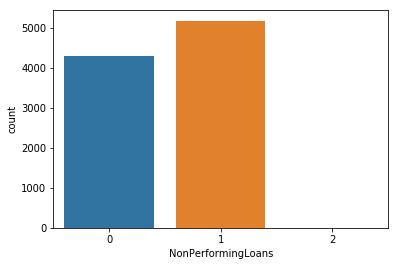

In [56]:
plot_groups(non_null["NonPerformingLoans"])

/home/stush/.local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


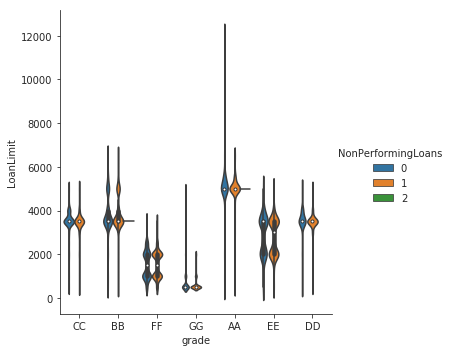

In [236]:
with sn.axes_style(style='ticks'):
    g = sn.catplot("grade", "LoanLimit", "NonPerformingLoans", data=non_null, kind="violin")

In [9]:
df_NPL = non_null.groupby("LoanLimit").size().to_frame('size')

In [10]:
new_nonnull = non_null[non_null.NonPerformingLoans != 2]

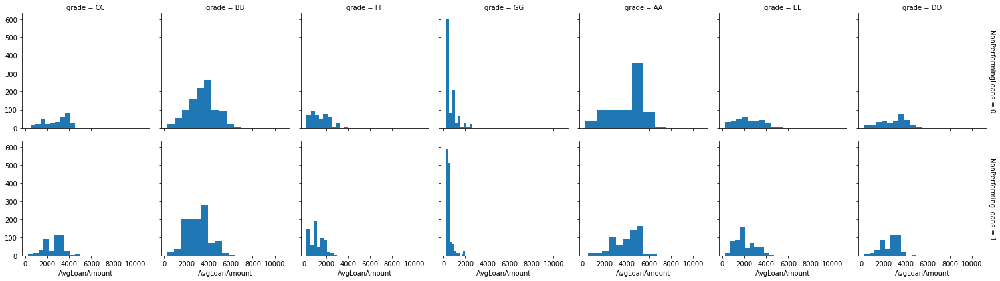

In [11]:
grid = sn.FacetGrid(new_nonnull, row="NonPerformingLoans", col="grade", margin_titles=True)
grid.map(plt.hist, "AvgLoanAmount");

In [72]:
df_NPL

,size
LoanLimit,
500.0,2053
1000.0,828
1500.0,116
2000.0,938
2500.0,189
3000.0,168
3500.0,2582
4000.0,489
4500.0,16


In [65]:
displayall(non_null.groupby("NonPerformingLoans").count())

,ClientID,Loans,DefaultedLoans,ClearedLoans,AvgLoanAmount,LastLoanAmount,LastLoanPeriod,Lending,AvgLendingAmount,LastLendingAmount,LastLoanOn,LastDefaultOn,LastNpaOn,Createdon,Defaulted > 10 Days,LastDefault > 10 On,LastRepaymentOn,MaxLoanAmount,LastDefault > 2on,Defaulted>2,CRBListed,LoanLimit,LastLimitOn,grade,MobileLoansScore,Propability,avgMobiLoanPrincipalAmountmySector,creditHistorymySector,creditHistoryotherSector,lastMobiLoanPrincipalAmountmySector,lastMobiLoanPrincipalAmountotherSector,maxMobiLoanPrincipalAmountmySector,maxMobiLoanPrincipalAmountotherSector,paAccountsmySector,paAccountsotherSector,npaAccountsmySector,npaAccountsotherSector,paAccountsWithDhmySector,paAccountsWithDhotherSector,newcolumn,join,joint
NonPerformingLoans,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,3733,0,4296,4296,2021,4266,4005,2584,4296,4296,4005,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296,4296
1,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,4590,5183,5183,5183,5183,5099,5081,1760,5183,5183,5081,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183,5183
2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2


In [12]:
new_df = eda_df[eda_df.LastLoanOn.notnull()]

In [13]:
count_null(new_df)

ClientID                                     0
Loans                                        0
DefaultedLoans                               0
NonPerformingLoans                           0
ClearedLoans                                 0
AvgLoanAmount                                0
LastLoanAmount                               0
LastLoanPeriod                               0
Lending                                      0
AvgLendingAmount                             0
LastLendingAmount                            0
LastLoanOn                                   0
LastDefaultOn                             1156
LastNpaOn                                 4296
Createdon                                    0
Defaulted >  10 Days                         0
LastDefault > 10 On                       2275
LastRepaymentOn                            114
MaxLoanAmount                              393
LastDefault > 2on                         5136
Defaulted>2                                  0
CRBListed    

In [10]:
count_null(eda_df)

ClientID                                     0
Loans                                        0
DefaultedLoans                               0
NonPerformingLoans                           0
ClearedLoans                                 0
AvgLoanAmount                                0
LastLoanAmount                               0
LastLoanPeriod                               0
Lending                                      0
AvgLendingAmount                             0
LastLendingAmount                            0
LastLoanOn                                 519
LastDefaultOn                             1674
LastNpaOn                                 4810
Createdon                                    0
Defaulted >  10 Days                         0
LastDefault > 10 On                       2789
LastRepaymentOn                            629
MaxLoanAmount                              902
LastDefault > 2on                         5655
Defaulted>2                                  0
CRBListed    

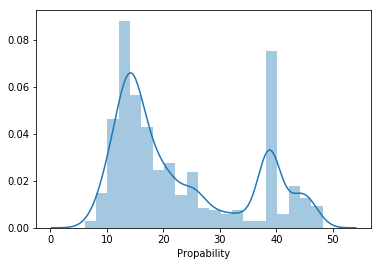

In [121]:
plothist(new_nonnull['Propability'])

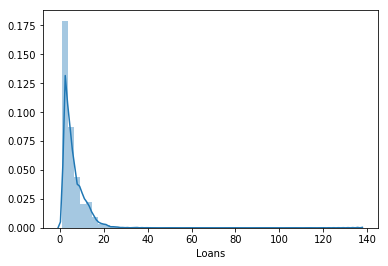

In [127]:
plothist(new_nonnull['Loans'])

In [124]:
last_loan = new_nonnull[new_nonnull.lastMobiLoanPrincipalAmountmySector > 0]

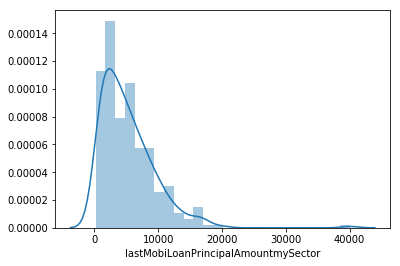

In [125]:
plothist(last_loan['lastMobiLoanPrincipalAmountmySector'])

In [ ]:
"""
We'll have to convert:into Binary (1,0)

LastDefaultOn, ---> has_defaulted

,

LastRepaymentOn,



"""
"""
We'll have to drop LastNpaOn
               LastDefault>10 On
               LastDefault >2on 
               npaAccountsotherSector

"""


In [26]:
def desc_dataframe(df):
    """
    Function to describe dataframe
    
    """
    return displayall(df.describe(include = 'all'))

In [43]:
data['Defaulted >  10 Days'].head()

0    1
1    2
2    1
3    0
4    1
Name: Defaulted >  10 Days, dtype: int64

In [27]:
desc_dataframe(data)

,ClientID,Loans,DefaultedLoans,NonPerformingLoans,ClearedLoans,AvgLoanAmount,LastLoanAmount,LastLoanPeriod,Lending,AvgLendingAmount,LastLendingAmount,LastLoanOn,LastDefaultOn,LastNpaOn,Createdon,Defaulted > 10 Days,LastDefault > 10 On,LastRepaymentOn,MaxLoanAmount,LastDefault > 2on,Defaulted>2,CRBListed,LoanLimit,LastLimitOn,grade,MobileLoansScore,Propability,avgMobiLoanPrincipalAmountmySector,creditHistorymySector,creditHistoryotherSector,lastMobiLoanPrincipalAmountmySector,lastMobiLoanPrincipalAmountotherSector,maxMobiLoanPrincipalAmountmySector,maxMobiLoanPrincipalAmountotherSector,paAccountsmySector,paAccountsotherSector,npaAccountsmySector,npaAccountsotherSector,paAccountsWithDhmySector,paAccountsWithDhotherSector
count,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,9481,8326,5190,10000,10000.00000,7211,9371,9098.000000,4345,10000.000000,10000.000000,9098.00000,10000,9989,9989.000000,9888.000000,10000.000000,9989.000000,9989.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,9989.000000,9989.000000,9989.000000,9989.000000,9989.000000,9989.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9481,8326,5187,9995,NaN,7210,9370,NaN,4345,NaN,NaN,NaN,2,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-05-25 10:12:46.783,2018-10-16 09:40:05.430,2018-12-24 02:18:22.190,2018-03-18 13:38:14.000,NaN,2018-05-27 09:20:29.000,2018-05-27 09:20:29.000,NaN,2018-10-12 01:37:00.990,NaN,NaN,NaN,2018-10-16 19:23:04.507,GG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2,2,NaN,2,2,NaN,1,NaN,NaN,NaN,9999,2566,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,28040.165300,4.922400,1.73780,0.519200,4.365300,2163.856636,2458.590000,20.173000,2.885900,196.432458,157.21000,NaN,NaN,NaN,NaN,0.65870,NaN,NaN,2716.805891,NaN,0.808900,0.223900,2718.94922,NaN,NaN,578.588447,23.511641,165.095918,1.264991,29.994394,166.110303,4884.816677,169.192238,1.592431e+04,0.189208,16.279708,0.002403,0.020422,0.017219,0.490139
std,15817.971029,4.819907,1.51904,0.500056,4.801662,1615.155625,1723.679007,8.959246,52.529883,1425.372720,795.39379,NaN,NaN,NaN,NaN,0.57223,NaN,NaN,1680.955943,NaN,0.626115,0.416877,1686.35065,NaN,NaN,110.674759,12.063652,1187.870068,5.904404,15.525347,1200.440434,7730.941829,1239.693621,6.958263e+04,0.671402,13.560306,0.052892,0.222807,0.138300,0.848936
min,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,500.000000,NaN,0.000000,0.000000,500.00000,NaN,NaN,-1.000000,6.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15198.500000,2.000000,1.00000,0.000000,1.000000,513.671800,1000.000000,10.000000,0.000000,0.000000,0.00000,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,1000.000000,NaN,0.000000,0.000000,1000.00000,NaN,NaN,470.000000,14.010000,0.000000,0.000000,20.000000,0.000000,640.000000,0.000000,2.000000e+03,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000
50%,27672.500000,3.000000,1.00000,1.000000,3.000000,1933.105400,2000.000000,20.000000,0.000000,0.000000,0.00000,NaN,NaN,NaN,NaN,1.00000,NaN,NaN,3500.000000,NaN,1.000000,0.000000,3500.00000,NaN,NaN,625.000000,18.120000,0.000000,0.000000,25.000000,0.000000,2300.000000,0.000000,6.000000e+03,0.000000,14.000000,0.000000,0.000000,0.000000,0.000000
75%,40193.250000,7.000000,2.00000,1.000000,6.000000,3445.312500,3500.000000,30.000000,0.000000,0.000000,0.00000,NaN,NaN,NaN,NaN,1.00000,NaN,NaN,3500.000000,NaN,1.000000,0.000000,3500.00000,NaN,NaN,659.000000,38.250000,0.000000,0.000000,45.000000,0.000000,6208.650000,0.000000,1.392600e+04,0.000000,22.000000,0.000000,0.000000,0.000000,1.000000


- __avgMobiLoanPrincipalAmountmySector__ : The average principal amount of Mobile loan given to the client

- __creditHistorymySector__ : Length of credit history in month of the client in this sector

- __creditHistoryotherSector__ : Length of credit history in months of the client other sectors

- __lastMobiLoanPrincipalAmountmySector__ : The last mobile loan principal amount in this sector

- __lastMobiLoanPrincipalAmountotherSector__ : The last mobile loan principal amount in other sector

- __maxMobiLoanPrincipalAmountmySector__ : Maximum principal amount on loan in this sector

- __maxMobiLoanPrincipalAmountotherSector__ : Maximum principal amount on loan in other sector

- __paAccountsmySector__ : Count of performing accounts in this sector

- __paAccountsotherSector__ : Count of performing accounts in other sector

- __npaAccountsmySector__ : Count of non performing accounts in this sector

- __npaAccountsotherSector__ : Count of non performing accounts in other sector

- __paAccountsWithDhmySector__ : Count of performing accounts with default history in this sector

- __paAccountsWithDhotherSector__ : Count of performing accounts with default history in other sector

In [15]:
def plothist(col):
    """
    Function to plot distributions of various columns
    
    """
    sn.distplot(col)

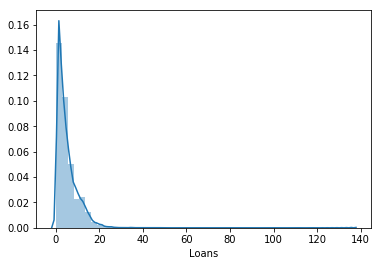

In [18]:
plothist(data["Loans"])

In [217]:
re_new['CRBListed'].value_counts()

0    7241
1    2238
Name: CRBListed, dtype: int64

In [253]:
re_new['LastLoanOn'] = pd.to_datetime(re_new['Createdon'])

In [254]:
df_datepart = add_datepart(re_new,'Createdon')

In [ ]:
plt.figure(figsize = (14,6))

g = sns.pointplot(x='issue_month', y='loan_amnt', 
                  data=df_loan, 
                  hue='loan_status')
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.set_xlabel("Duration Distribuition", fontsize=15)
g.set_ylabel("Mean amount", fontsize=15)
g.legend(loc='best')
g.set_title("Loan Amount by Months", fontsize=20)
plt.show()

In [98]:
def plot_groups_hue(col,df):
    """
    Function for group by plot
    
    """
    sn.countplot(df[col],hue = df['NonPerformingLoans'])

In [114]:
lender = new_nonnull[new_nonnull.Lending > 200]

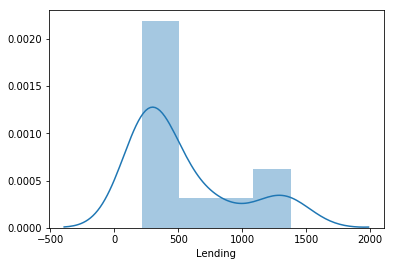

In [115]:
plothist(lender['Lending'])

In [133]:
pd.cut(new_nonnull['Propability'],20).value_counts()

(12.401, 14.508]    1700
(37.685, 39.792]    1411
(14.508, 16.615]    1091
(10.294, 12.401]     909
(16.615, 18.722]     889
(25.043, 27.15]      470
(18.722, 20.829]     468
(20.829, 22.936]     432
(8.187, 10.294]      341
(41.899, 44.006]     339
(44.006, 46.113]     245
(22.936, 25.043]     245
(46.113, 48.22]      177
(29.257, 31.364]     148
(39.792, 41.899]     144
(27.15, 29.257]      134
(33.471, 35.578]     123
(31.364, 33.471]     106
(6.038, 8.187]        55
(35.578, 37.685]      52
Name: Propability, dtype: int64

In [147]:
re_new = new_nonnull.drop(["joint","prob_classes","join"],axis = 1)

In [167]:
re_new["prob_classes"] = pd.cut(new_nonnull['Propability'],20).cat.codes

We only have 7 categories of probability of default

In [178]:
re_new["prob_class_new"] = pd.cut(new_nonnull['Propability'],7).cat.codes

In [185]:
re_new["Lending_class"] = pd.cut(new_nonnull['Lending'],10).cat.codes

In [233]:
re_new["Loans_class"] = pd.cut(re_new['Loans'],20).cat.codes

In [234]:
re_new["Loans_cats"] = pd.cut(re_new['Loans'],20)

In [213]:
re_new["OtherSectorPALoan_class"] = pd.cut(re_new['avgMobiLoanPrincipalAmountmySector'],3).cat.codes

In [211]:
re_new["OtherSectorPALoan_cats"] = pd.cut(re_new['avgMobiLoanPrincipalAmountmySector'],3)

In [212]:
re_new["OtherSectorPALoan_cats"].value_counts().to_frame()

,OtherSectorPALoan_cats
"(-40.0, 13333.333]",9465
"(13333.333, 26666.667]",13
"(26666.667, 40000.0]",1


In [232]:
re_new["Loans"].value_counts()

1      1955
2      1489
3      1140
4       902
5       757
6       582
7       457
9       333
8       329
10      284
11      237
12      225
13      192
14      152
15      108
16       87
17       48
18       41
19       35
20       28
21       28
22       15
23        9
25        9
24        8
26        7
27        3
35        3
31        2
29        2
28        2
34        2
49        1
37        1
30        1
136       1
48        1
40        1
38        1
33        1
Name: Loans, dtype: int64

In [235]:
re_new["Loans_cats"].value_counts()

(0.865, 7.75]      7282
(7.75, 14.5]       1752
(14.5, 21.25]       375
(21.25, 28.0]        53
(28.0, 34.75]         8
(34.75, 41.5]         6
(48.25, 55.0]         1
(41.5, 48.25]         1
(129.25, 136.0]       1
(68.5, 75.25]         0
(122.5, 129.25]       0
(55.0, 61.75]         0
(75.25, 82.0]         0
(82.0, 88.75]         0
(88.75, 95.5]         0
(95.5, 102.25]        0
(102.25, 109.0]       0
(109.0, 115.75]       0
(115.75, 122.5]       0
(61.75, 68.5]         0
Name: Loans_cats, dtype: int64

In [199]:
re_new['OtherSectorPALoan_class'].value_counts()

0    9331
1      89
2      43
3      12
4       3
9       1
Name: OtherSectorPALoan_class, dtype: int64

In [184]:
new_nonnull['Lending'].value_counts()

0       8687
1        326
2        157
3         79
4         46
5         43
8         14
10        13
7         11
6         11
9          9
11         7
12         6
13         5
18         4
14         4
27         3
17         3
22         3
16         3
28         2
20         2
37         2
33         2
25         2
15         2
31         2
32         2
217        1
81         1
65         1
50         1
288        1
280        1
26         1
34         1
271        1
58         1
562        1
183        1
47         1
39         1
806        1
406        1
262        1
62         1
46         1
1237       1
53         1
21         1
60         1
36         1
239        1
67         1
19         1
1378       1
131        1
Name: Lending, dtype: int64

In [171]:
re_new["prob_classes"].value_counts()

3     1700
15    1411
4     1091
2      909
5      889
9      470
6      468
7      432
1      341
17     339
18     245
8      245
19     177
11     148
16     144
10     134
13     123
12     106
0       55
14      52
Name: prob_classes, dtype: int64

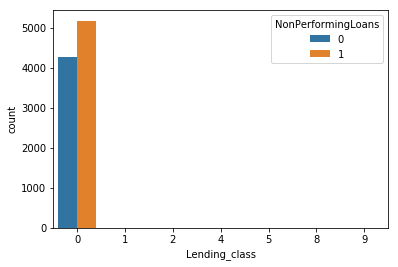

In [186]:
sn.countplot(x='Lending_class', data=re_new,
                  hue='NonPerformingLoans')

In [174]:
re_new.head()

,ClientID,Loans,DefaultedLoans,NonPerformingLoans,ClearedLoans,AvgLoanAmount,LastLoanAmount,LastLoanPeriod,Lending,AvgLendingAmount,...,maxMobiLoanPrincipalAmountotherSector,paAccountsmySector,paAccountsotherSector,npaAccountsmySector,npaAccountsotherSector,paAccountsWithDhmySector,paAccountsWithDhotherSector,newcolumn,prob_class,prob_classes
0,3325,1,1,1,0,1000.0000,2000.0,10,0,0.0,...,4700.0,1.0,5.0,0.0,0.0,1.0,1.0,-88.0,"(14.508, 16.615]",4
1,3391,2,2,1,1,1125.0000,2000.0,10,0,0.0,...,11250.0,1.0,29.0,0.0,0.0,0.0,1.0,-178.0,"(12.401, 14.508]",3
2,3423,4,1,1,3,1250.0000,1500.0,30,0,0.0,...,400.0,2.0,6.0,0.0,0.0,0.0,0.0,-47.0,"(29.257, 31.364]",11
3,3442,7,1,0,7,1464.8437,2000.0,10,0,0.0,...,15400.0,1.0,22.0,0.0,0.0,0.0,1.0,-66.0,"(39.792, 41.899]",16
4,3508,8,3,0,8,984.3750,1000.0,20,0,0.0,...,2600.0,0.0,13.0,0.0,0.0,0.0,0.0,-188.0,"(46.113, 48.22]",19


In [183]:
categories= ['Lending_class', 'prob_class_new']
cm = sn.light_palette("green", as_cmap=True)
pd.crosstab(re_new[categories[0]], re_new[categories[1]]).style.background_gradient(cmap = cm)

prob_class_new,0,1,2,3,4,5,6
Lending_class,,,,,,,
0,1222,3604,1218,754,319,1596,759
1,1,1,0,0,0,1,0
2,0,2,0,0,0,0,0
4,1,1,0,0,0,0,0


In [214]:
categories= ['grade', 'OtherSectorPALoan_class']
cm = sn.light_palette("green", as_cmap=True)
pd.crosstab(re_new[categories[0]], re_new[categories[1]]).style.background_gradient(cmap = cm)

OtherSectorPALoan_class,0,1,2
grade,,,
AA,1436,4,0
BB,2133,1,0
CC,769,1,0
DD,743,0,0
EE,904,2,0
FF,1118,1,1
GG,2362,4,0


In [215]:
categories= ['NonPerformingLoans', 'OtherSectorPALoan_class']
cm = sn.light_palette("green", as_cmap=True)
pd.crosstab(re_new[categories[0]], re_new[categories[1]]).style.background_gradient(cmap = cm)

OtherSectorPALoan_class,0,1,2
NonPerformingLoans,,,
0,4287,8,1
1,5178,5,0


In [219]:
categories= ['NonPerformingLoans', 'CRBListed']
cm = sn.light_palette("green", as_cmap=True)
pd.crosstab(re_new[categories[0]], re_new[categories[1]]).style.background_gradient(cmap = cm)


CRBListed,0,1
NonPerformingLoans,,
0,4019,277
1,3222,1961


In [220]:
categories= ['grade', 'CRBListed']
cm = sn.light_palette("green", as_cmap=True)
pd.crosstab(re_new[categories[0]], re_new[categories[1]]).style.background_gradient(cmap = cm)

CRBListed,0,1
grade,,
AA,1048,392
BB,1548,586
CC,592,178
DD,553,190
EE,673,233
FF,881,239
GG,1946,420


In [221]:
categories= ['Loans', 'CRBListed']
cm = sn.light_palette("green", as_cmap=True)
pd.crosstab(re_new[categories[0]], re_new[categories[1]]).style.background_gradient(cmap = cm)

CRBListed,0,1
Loans,,
1,1882,73
2,1297,192
3,766,374
4,521,381
5,415,342
6,322,260
7,273,184
8,211,118
9,242,91


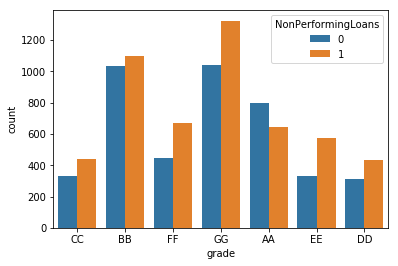

In [119]:
sn.countplot(x='grade', data=new_nonnull,
                  hue='NonPerformingLoans')

#Default rates are not that significantly different across different loan grades. Even for AA rated clients,the default rate is almost similar

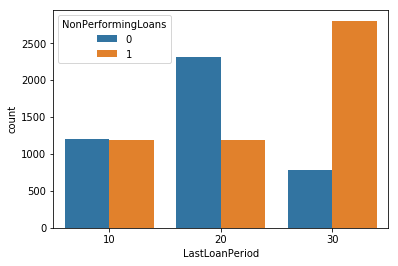

In [91]:
sn.countplot(x='LastLoanPeriod', data=new_nonnull,
                  hue='NonPerformingLoans')

- 10 day loans have eqaul NPLs and Non-NPLs
- 20 day loan  Non-NPLs are more than NPLs
- 30 day loans have the highest NPLs

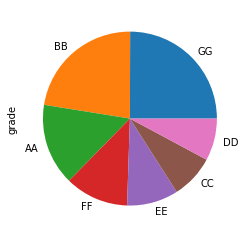

In [118]:
new_nonnull["grade"].value_counts().plot('pie')

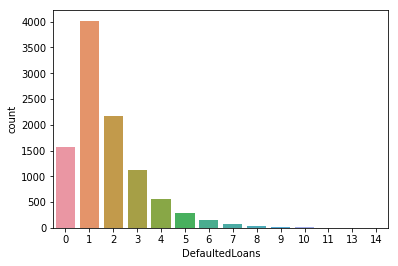

In [30]:
plot_groups(data["DefaultedLoans"])

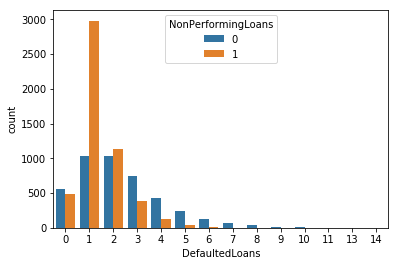

In [92]:
sn.countplot(x='DefaultedLoans', data=new_nonnull,
                  hue='NonPerformingLoans')

In [93]:
new_nonnull['DefaultedLoans'].value_counts()

1     4016
2     2166
3     1127
0     1045
4      551
5      284
6      143
7       79
8       37
9       15
10      11
14       2
11       2
13       1
Name: DefaultedLoans, dtype: int64

In [97]:
new_nonnull.groupby('NonPerformingLoans').DefaultedLoans.value_counts().to_frame()

DefaultedLoans
NonPerformingLoans DefaultedLoans                
0                  1                         1036
                   2                         1031
                   3                          739
                   0                          555
                   4                          423
                   5                          240
                   6                          130
                   7                           76
                   8                           36
                   9                           14
                   10                          11
                   11                           2
                   14                           2
                   13                           1
1                  1                         2980
                   2                         1135
                   0                          490
                   3                          388
                   4                          128
                   5                           44
                   6                           13
                   7                            3
                   8                            1
                   9                            1

- Anomaly: Some clients have NPLs but have zero defaulted loans,wtf??

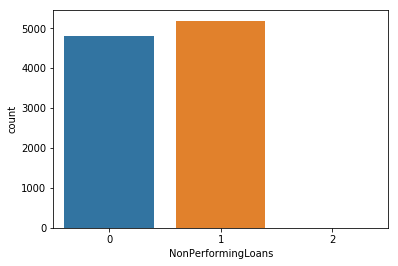

In [31]:
plot_groups(data["NonPerformingLoans"])

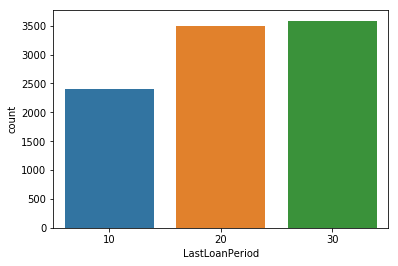

In [67]:
plot_groups(non_null["LastLoanPeriod"])

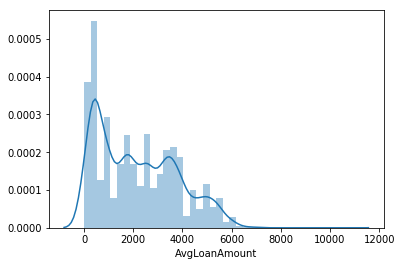

In [36]:
plothist(data["AvgLoanAmount"])

In [5]:
loans = data

In [8]:
loans_two = data

In [6]:
loans.isna().sum()

ClientID                                     0
Loans                                        0
DefaultedLoans                               0
NonPerformingLoans                           0
ClearedLoans                                 0
AvgLoanAmount                                0
LastLoanAmount                               0
LastLoanPeriod                               0
Lending                                      0
AvgLendingAmount                             0
LastLendingAmount                            0
LastLoanOn                                 519
LastDefaultOn                             1674
LastNpaOn                                 4810
Createdon                                    0
Defaulted >  10 Days                         0
LastDefault > 10 On                       2789
LastRepaymentOn                            629
MaxLoanAmount                              902
LastDefault > 2on                         5655
Defaulted>2                                  0
CRBListed    

In [9]:
loans_two["Createdon"] = pd.to_datetime(loans_two["Createdon"])

In [ ]:
new_nonnull['']

In [116]:
df_count_two = loans_two.groupby("MaxLoanAmount").size().to_frame('size')

NameError: name 'loans_two' is not defined

In [11]:
df_count_two.head()

,size
Createdon,
2018-02-23,3
2018-02-26,1
2018-02-28,2
2018-03-10,1
2018-03-11,9


In [51]:
data["Createdon"] = pd.to_datetime(data["Createdon"])

In [52]:
add_datepart(data,'Createdon')

In [53]:
data.head()

,ClientID,Loans,DefaultedLoans,NonPerformingLoans,ClearedLoans,AvgLoanAmount,LastLoanAmount,LastLoanPeriod,Lending,AvgLendingAmount,...,lastMobiLoanPrincipalAmountmySector,lastMobiLoanPrincipalAmountotherSector,maxMobiLoanPrincipalAmountmySector,maxMobiLoanPrincipalAmountotherSector,paAccountsmySector,paAccountsotherSector,npaAccountsmySector,npaAccountsotherSector,paAccountsWithDhmySector,paAccountsWithDhotherSector
0,3325,1,1,1,0,1000.0000,2000.0,10,0,0.0,...,0.0,4700.0,0.0,4700.0,1.0,5.0,0.0,0.0,1.0,1.0
1,3391,2,2,1,1,1125.0000,2000.0,10,0,0.0,...,0.0,7550.0,0.0,11250.0,1.0,29.0,0.0,0.0,0.0,1.0
2,3423,4,1,1,3,1250.0000,1500.0,30,0,0.0,...,0.0,400.0,0.0,400.0,2.0,6.0,0.0,0.0,0.0,0.0
3,3442,7,1,0,7,1464.8437,2000.0,10,0,0.0,...,0.0,400.0,0.0,15400.0,1.0,22.0,0.0,0.0,0.0,1.0
4,3508,8,3,0,8,984.3750,1000.0,20,0,0.0,...,0.0,2600.0,0.0,2600.0,0.0,13.0,0.0,0.0,0.0,0.0


In [49]:
displayall(data.transpose())

0     \
ClientID                                                   3325   
Loans                                                         1   
DefaultedLoans                                                1   
NonPerformingLoans                                            1   
ClearedLoans                                                  0   
AvgLoanAmount                                              1000   
LastLoanAmount                                             2000   
LastLoanPeriod                                               10   
Lending                                                       0   
AvgLendingAmount                                              0   
LastLendingAmount                                             0   
LastLoanOn                              2018-06-17 15:59:13.600   
LastDefaultOn                           2018-06-27 16:11:55.203   
LastNpaOn                               2018-08-27 02:04:04.147   
Createdon                                   2018-03-22 00:00:00   
Defaulted >  10 Days                                          1   
LastDefault > 10 On                     2018-07-08 02:09:37.923   
LastRepaymentOn                                             NaN   
MaxLoanAmount                                              2000   
LastDefault > 2on                                           NaN   
Defaulted>2                                                   1   
CRBListed                                                     0   
LoanLimit                                                  2000   
LastLimitOn                             2018-10-16 19:23:04.507   
grade                                                        CC   
MobileLoansScore                                            649   
Propability                                               15.27   
avgMobiLoanPrincipalAmountmySector                            0   
creditHistorymySector                                        17   
creditHistoryotherSector                                     23   
lastMobiLoanPrincipalAmountmySector                           0   
lastMobiLoanPrincipalAmountotherSector                     4700   
maxMobiLoanPrincipalAmountmySector                            0   
maxMobiLoanPrincipalAmountotherSector                      4700   
paAccountsmySector                                            1   
paAccountsotherSector                                         5   
npaAccountsmySector                                           0   
npaAccountsotherSector                                        0   
paAccountsWithDhmySector                                      1   
paAccountsWithDhotherSector                                   1   
CreatedonYear                                              2018   
CreatedonMonth                                                3   
CreatedonWeek                                                12   
CreatedonDay                                                 22   
CreatedonDayofweek                                            3   
CreatedonDayofyear                                           81   
CreatedonIs_month_end                                     False   
CreatedonIs_month_start                                   False   
CreatedonIs_quarter_end                                   False   
CreatedonIs_quarter_start                                 False   
CreatedonIs_year_end                                      False   
CreatedonIs_year_start                                    False   
CreatedonHour                                                 0   
CreatedonMinute                                               0   
CreatedonSecond                                               0   
CreatedonElapsed                                     1521676800   

                                                           1     \
ClientID                                                   3391   
Loans                                                         2   
DefaultedLoans                        

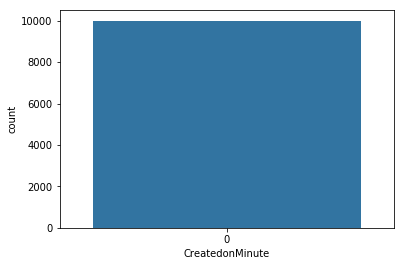

In [38]:
plot_groups(data["CreatedonMinute"])

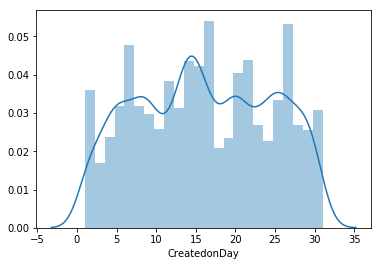

In [35]:
plothist(data["CreatedonDay"])

In [9]:
def to_date(df,col):
    """
    Function to format date to mm/dd/yy for easy aggregation
    
    """
    
    df[col] = pd.to_datetime(df[col]).apply(lambda x : x.strftime("%m/%d/%Y"))


In [6]:
to_date(loans,"Createdon")

In [7]:
loans["Createdon"].tail()

9995    05/28/2018
9996    05/28/2018
9997    05/28/2018
9998    05/28/2018
9999    05/28/2018
Name: Createdon, dtype: object

In [10]:
loans["createdon_new"] = to_date(loans,"Createdon")

In [21]:
df_count = loans.groupby("Createdon").size().to_frame('size')

In [30]:
df_count2 = loans.groupby("Createdon").size().to_frame('size')

In [31]:
df_count2.tail()

,size
Createdon,
05/24/2018,47
05/25/2018,121
05/26/2018,154
05/27/2018,43
05/28/2018,11


In [25]:
df_count["obj_count"] = df_count['size'].cumsum()

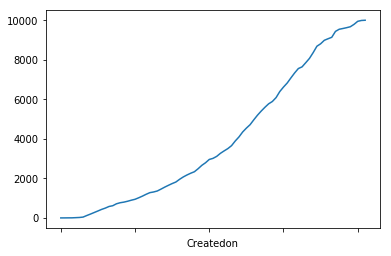

In [29]:
df_count['obj_count'].plot()

In [ ]:
sns.tsplot(data=)

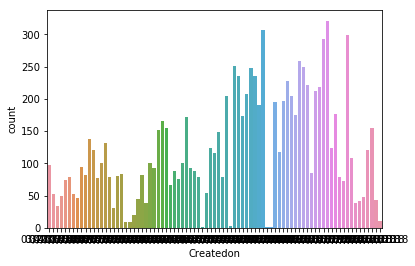

In [94]:
plot_groups(loans["Createdon"])

In [98]:
def change_index(df,date_column):
    """
    Function to set date as index
    
    """
    df.index = df[date_column]

In [99]:
change_index(loans,"Createdon")

In [100]:
loans.head()

,ClientID,Loans,DefaultedLoans,NonPerformingLoans,ClearedLoans,AvgLoanAmount,LastLoanAmount,LastLoanPeriod,Lending,AvgLendingAmount,...,lastMobiLoanPrincipalAmountmySector,lastMobiLoanPrincipalAmountotherSector,maxMobiLoanPrincipalAmountmySector,maxMobiLoanPrincipalAmountotherSector,paAccountsmySector,paAccountsotherSector,npaAccountsmySector,npaAccountsotherSector,paAccountsWithDhmySector,paAccountsWithDhotherSector
Createdon,,,,,,,,,,,,,,,,,,,,,
03/22/2018,3325,1,1,1,0,1000.0000,2000.0,10,0,0.0,...,0.0,4700.0,0.0,4700.0,1.0,5.0,0.0,0.0,1.0,1.0
03/22/2018,3391,2,2,1,1,1125.0000,2000.0,10,0,0.0,...,0.0,7550.0,0.0,11250.0,1.0,29.0,0.0,0.0,0.0,1.0
03/22/2018,3423,4,1,1,3,1250.0000,1500.0,30,0,0.0,...,0.0,400.0,0.0,400.0,2.0,6.0,0.0,0.0,0.0,0.0
03/22/2018,3442,7,1,0,7,1464.8437,2000.0,10,0,0.0,...,0.0,400.0,0.0,15400.0,1.0,22.0,0.0,0.0,0.0,1.0
03/22/2018,3508,8,3,0,8,984.3750,1000.0,20,0,0.0,...,0.0,2600.0,0.0,2600.0,0.0,13.0,0.0,0.0,0.0,0.0


In [110]:
def drop_columns (df,column_list):
    """
    Function to drop columns.
    
    column_list = list of columns to be dropped
    
    """
    df.drop(column_list,axis=1)
    return df

In [111]:
new_loans = drop_columns(loans,['ClientID'])

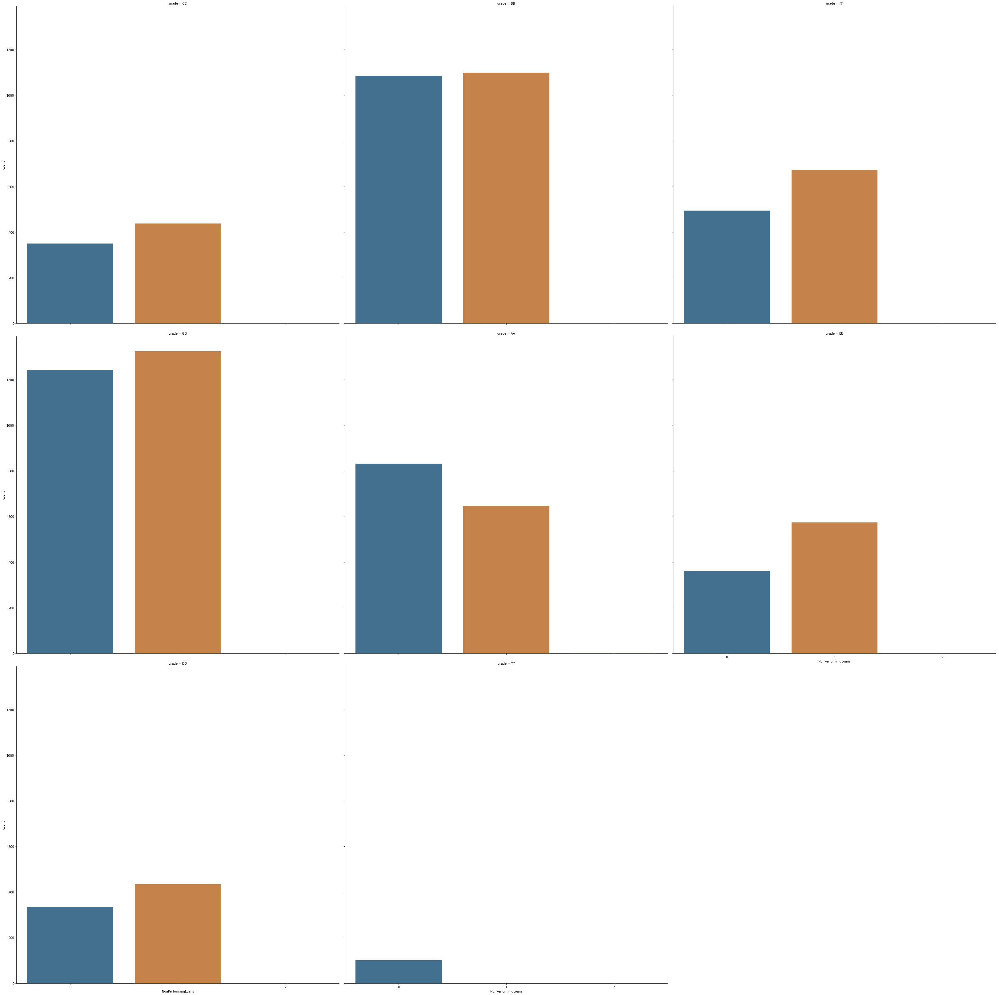

In [49]:
sn.catplot(x= 'NonPerformingLoans',
           col = 'grade',data=loans, 
           kind = 'count', 
           height = 15,
           col_wrap = 3,
          saturation = .5)

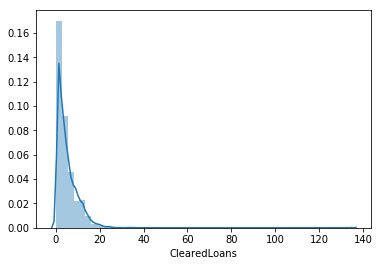

In [51]:
plothist(data["ClearedLoans"])